# EEG data analysis results with correct binning

In [157]:
# Here we import libraries and functions useful for the analysis

import pickle
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pickle as pkl

In [347]:
def plot_map4(l_array, r_array, title, min_lim, max_lim, type, upper):
    fig, ax = plt.subplots(nrows = 2, ncols =2, figsize=(16,10))

    if type=="Paper":
        v_max = max(np.max(np.mean(l_array[:,0:upper], axis=0).T),np.max(np.mean(r_array[:,0:upper], axis=0).T))*0.6
        v_min = min(np.min(np.mean(l_array[:,0:upper], axis=0).T),np.min(np.mean(r_array[:,0:upper], axis=0).T))*0.6

        l = ax[0][0].imshow(np.mean(l_array, axis=0).T, origin='lower', cmap='plasma', vmin=v_min, vmax=v_max)
        r = ax[0][1].imshow(np.mean(r_array, axis=0).T, origin='lower', cmap='cividis', vmin=v_min, vmax=v_max)

        l_m = np.mean(l_array, axis = (0,2))
        r_m = np.mean(r_array, axis = (0,2))

        l_s = np.std(l_array, axis=(0,2))/np.sqrt(15+120)
        r_s = np.std(r_array, axis=(0,2))/np.sqrt(15+120)

    elif type=="New":

        v_max = max(np.max(l_array[:,0:upper]),np.max(r_array[:,0:upper]))*0.6
        v_min = min(np.min(l_array[:,0:upper]),np.min(r_array[:,0:upper]))*0.6

        l = ax[0][0].imshow(l_array, origin='lower', cmap='plasma',vmin=v_min, vmax=v_max)
        r = ax[0][1].imshow(r_array, origin='lower', cmap='cividis',vmin=v_min, vmax=v_max)

        l_m = np.mean(l_array, axis = 0)
        r_m = np.mean(r_array, axis = 0)
      
        l_s = np.std(l_array, axis=0)/np.sqrt(15+120)
        r_s = np.std(r_array, axis=0)/np.sqrt(15+120)


    tmax = l_m.shape[0]

    t = np.arange(tmax)

    v_min_2 = min(np.min(l_m[0:upper]),np.min(r_m[0:upper]))*min_lim
    v_max_2 = max(np.max(l_m[0:upper]),np.max(r_m[0:upper]))*max_lim

    ax[1][0].grid(alpha=0.3)
    ax[1][0].plot(l_m, label='mean', color='C1')
    ax[1][0].set_title('LOT to ROT ' + title + ' (averaged over delays)')
    ax[1][0].fill_between(t, l_m-l_s, l_m+l_s, alpha=0.4, label = 'mean error', color='C1')
    ax[1][0].legend()
    ax[1][0].set_xlabel('peri-stimulus time (ms)')
    ax[1][0].set_ylabel('bits')
    ax[1][0].set_ylim((v_min_2,v_max_2))

    ax[1][1].grid(alpha=0.3)
    ax[1][1].plot(r_m, label='mean')
    ax[1][1].set_title('ROT to LOT ' + title + ' (averaged over delays)')
    ax[1][1].fill_between(t, r_m-r_s, r_m+r_s, alpha=0.4, label = 'mean error', color='C0')
    ax[1][1].legend()
    ax[1][1].set_xlabel('peri-stimulus time (ms)')
    ax[1][1].set_ylabel('bits')
    ax[1][1].set_ylim((v_min_2,v_max_2))

    l_cbar = ax[0][0].figure.colorbar(l, label='bits', location = 'bottom', pad = 0.15)
    r_cbar = ax[0][1].figure.colorbar(r, label='bits', location = 'bottom', pad = 0.15)

    formatter = ticker.ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-2, 2))  

    l_cbar.ax.xaxis.set_major_formatter(formatter)
    r_cbar.ax.xaxis.set_major_formatter(formatter)   

    ax[1][0].yaxis.set_major_formatter(formatter)
    ax[1][1].yaxis.set_major_formatter(formatter)

    ax[0][0].set_xlim(0,upper)
    ax[0][1].set_xlim(0,upper)

    ax[0][0].set_xlabel('peri-stimulus time (ms)')
    ax[0][1].set_xlabel('peri-stimulus time (ms)')

    ax[0][0].set_ylabel('delay (ms)')
    ax[0][1].set_ylabel('delay (ms)')

    ax[0][0].set_title('LOT to ROT ' + title)
    ax[0][1].set_title('ROT to LOT ' + title)

    ax[0][0].set_yticks(list(np.arange(0,80,20)))
    ax[0][0].set_yticklabels(list(np.arange(0,80,20)))
    #ax[0][0].set_xticks(list(np.arange(0,upper+11,50)))
    #ax[0][0].set_xticklabels(list(np.arange(60,upper+71,50).astype(str)))
    ax[0][1].set_yticks(list(np.arange(0,80,20)))
    ax[0][1].set_yticklabels(list(np.arange(0,80,20)))
    #ax[0][1].set_xticks(list(np.arange(0,upper+11,50)))
    #ax[0][1].set_xticklabels(list(np.arange(60,upper+71,50).astype(str)))
    #ax[1][0].set_xticks(list(np.arange(0,upper+11,50)))
    #ax[1][0].set_xticklabels(list(np.arange(60,upper+71,50).astype(str)))
    #ax[1][1].set_xticks(list(np.arange(0,upper+11,50)))
    #ax[1][1].set_xticklabels(list(np.arange(60,upper+71,50).astype(str)))


    plt.show()

In [3]:
# files
left_LR_file = 'eeg_left_LR_values.pkl'
left_RL_file = 'eeg_left_RL_values.pkl'

right_LR_file = 'eeg_right_LR_values.pkl'
right_RL_file = 'eeg_right_RL_values.pkl'

# load values
left_LR = np.array(read_file(left_LR_file))
left_RL = np.array(read_file(left_RL_file))

right_LR = np.array(read_file(right_LR_file))
right_RL = np.array(read_file(right_RL_file))

Next to test the performance of the FIT function we built we use it on a published dataset of EEG data measured on human participants involved in a lab test. The aim of the experiment was to measure the brain activity in certain regions through an EEG device when the participants were asked to detect the presence of either a face or a random texture in an image covered by a randomly generated mask. <br>
Previous tests showed that the detection depended on how much of the eye region of the faces shown was revealed. They then showed the appearance of a signal in a specific brain region called Occipito-Temporal on either sides of the brain. In particular the signal appeared roughly 120 ms after the image in the OT region on the opposite side to the position of the eye in the image and 20-40 ms later in the other side.<br> 
We aim at measuring if eye-specific information has travelled between the two brain regions through the FIT measure.

# Left Eye Visibility

We begin by looking for eye-specific directed information between OTs on opposite brain sides for left eye visibility. Here we expect to see a greater signal from the Right to the Left side since this is what was measured by previous tests.<br>
We begin by comparing Left to Right and Right to Left Directions for TE.

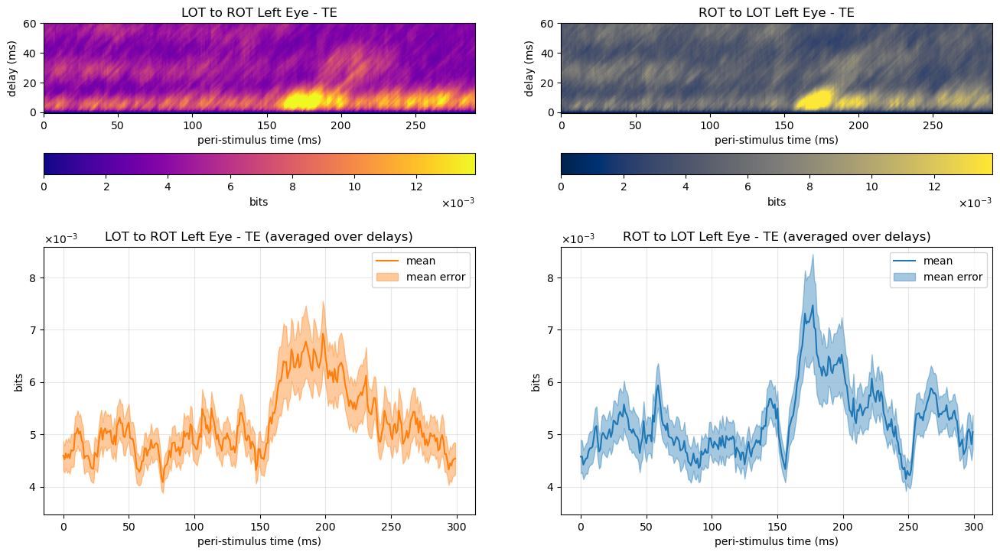

In [348]:
plot_map4(left_LR[0, :, :], left_RL[0, :, :], 'Left Eye - TE', 0.85,1.15,'Paper',290)

As we can see there is not much difference in the signals both in shape and strength. We see that in both there is a signal of strength 6-7 mBits at about 160 ms after the image in both directions, which appears to be a bit strange since it woulnd't imply any information transmission between the regions but an immediate surge in information observed in both. <br>
Also we can see from the heatmaps that the surge in informations happened for very small delays, too short for any information to be transferred confirming what we initially thought, that TE can't detect eye-specific information transmission between ROT and LOT.

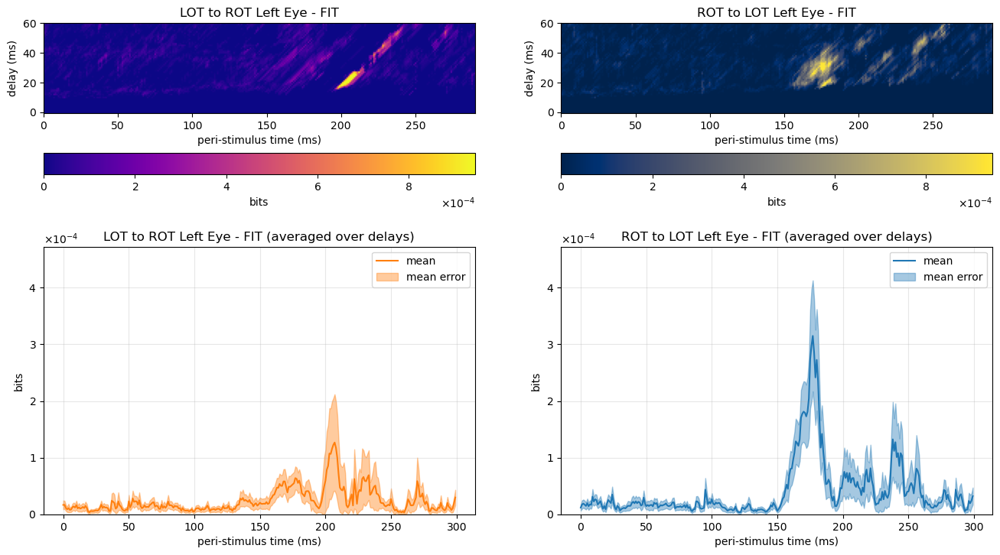

In [349]:
plot_map4(left_LR[1, :, :], left_RL[1, :, :], 'Left Eye - FIT',0.0,1.5,'Paper',290)

Moving onto what FIT detected we can see two information surges earlier from 160 ms at a strength of up to 0.3 mBits for ROT to LOT, and a smaller but more concentrated signal at 0.1 mBits in the opposite direction about 40 ms later. From the heatmaps both signals where measured considering a delay of 20 to 40 ms. <br>
This confirms that there was an eye-specific signal transmitted from the ROT to the LOT as expected, and also a much weaker signal in the opposite direction later on. This difference both in strenght and time highlights how FIT can distinguish with greater precision the correct feature specific information flow correctly assessing that after 160 ms after the image there was a clear ROT to LOT signal and no opposite direction one. 

# Right Eye Visibility

We do the same for the right eye.

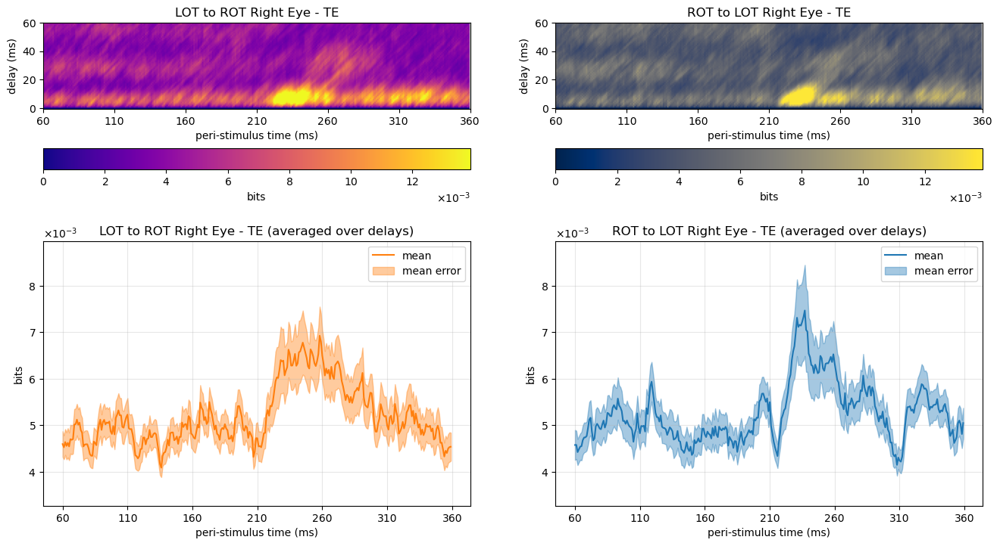

In [326]:
plot_map4(right_LR[0, :, :], right_RL[0, :, :], 'Right Eye - TE',0.8,1.2,'Paper',290)

We see a similar pattern to what we saw for the right eye, so no ability to distinguish the feature specific information flow between the correct regions.

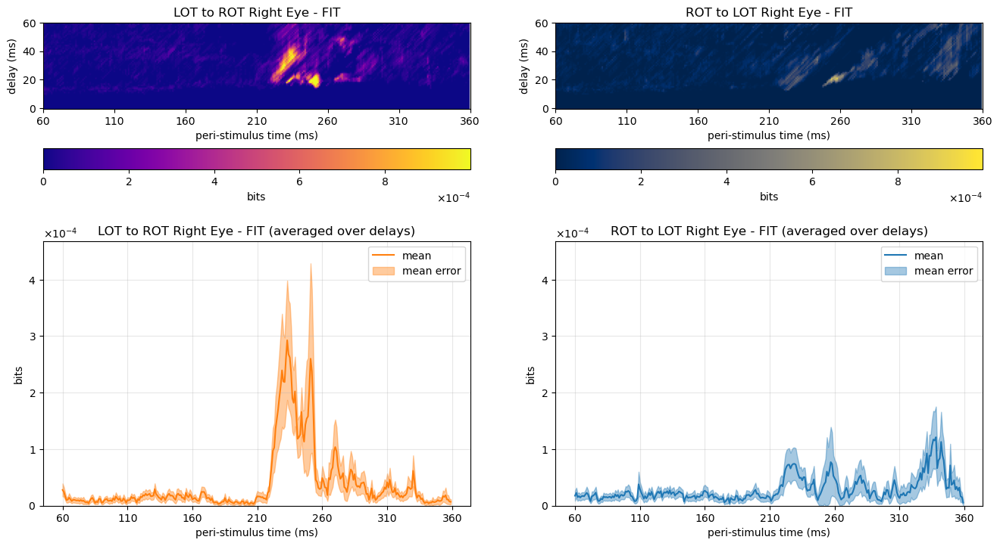

In [327]:
plot_map4(right_LR[1, :, :], right_RL[1, :, :], 'Right Eye - FIT',0.0,1.6,'Paper',290)

For FIT  we see a clear signal in the LOT to ROT direction as expected.

##  Bias Corrections

It is often observed that information measures like FIT or TE are systematically biased when having a small number of samples. Such bias is proportional to the inverse of the sample size through a power law that is often non linear. To determine its nature for our dataset we compute both linear and quadratic approximations of the FIT and TE measures varying the dataset size.<br><br>
For a linear bias $b(x) = ax + c$ with $x=\frac{1}{N}$, where $N$ is the sample size and $a$ and $c$ fit variables. Here the unbiased estimation would happen for a dataset of infinite size where $b(x)=c$.<br><br>
For a quadratic bias $b(x) = ax^2 + cx + d$ with $x=\frac{1}{N}$, where $N$ is the sample size and $a$, $c$ and $d$ fit variables. Here the unbiased estimation would happen for a dataset of infinite size where $b(x)=d$.<br><br>
In practice we turn the original datasets into 3 different sized sets of datasets, 1 dataset equal to the original, 2 with half the size and 4 with a fourth of the size. We compute the FIT and TE on each of the subsets and get a mean value for each of the 3 sizes. We then fit a linear or quadratic model to it and take the intercept in both as the unbiased estimate.

As far as TE goes we can see that a linear correction doesn't really change the values of our estimate, indicating that the original sample size might be already close to the asymptotic one.<br>
For the quadratic one we see negative values, which can indicate two things, either the correction to be made is not non linear or the number of subsets used to do the fit is too small and too sensible to specific variations among the subsections (which would lead to a negative correction in some cases). However such negative values are seen among other measures and datasets, as well as in the new data, which we interpreted as a robust enough indication that the approximately linear assumption holds in general for our dataset type.<br>
To see how much the linear correction adjusted the original TE and FIT we show the residuals as well.

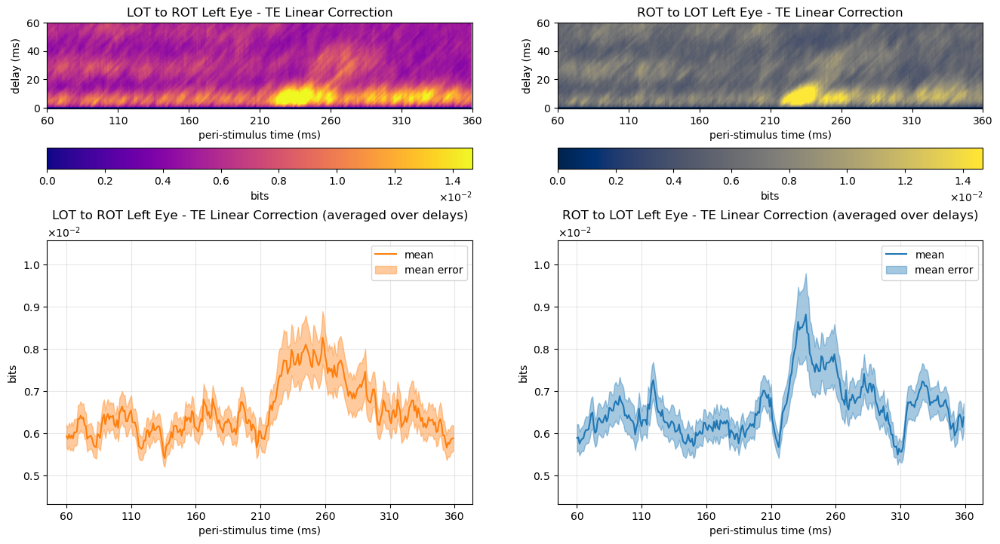

In [328]:
plot_map4(left_LR[4, :, :], left_RL[4, :, :], 'Left Eye - TE Linear Correction',0.8,1.2,'Paper',290)

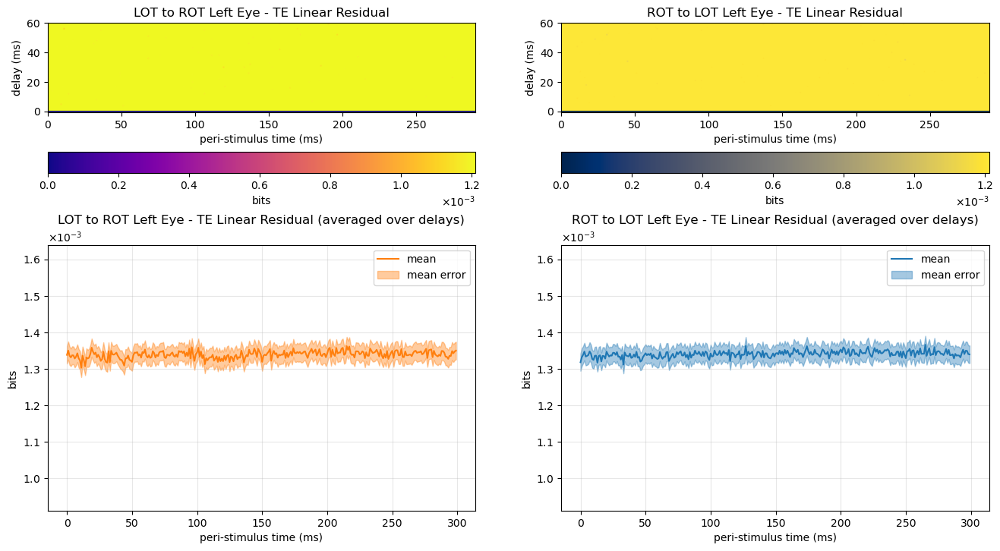

In [350]:
plot_map4(abs(left_LR[4, :, :, :]-left_LR[0, :, :, : ]), abs(left_RL[4, :, :, :]-left_RL[0, :, :, :]), 'Left Eye - TE Linear Residual',0.7,1.2,'Paper',290)

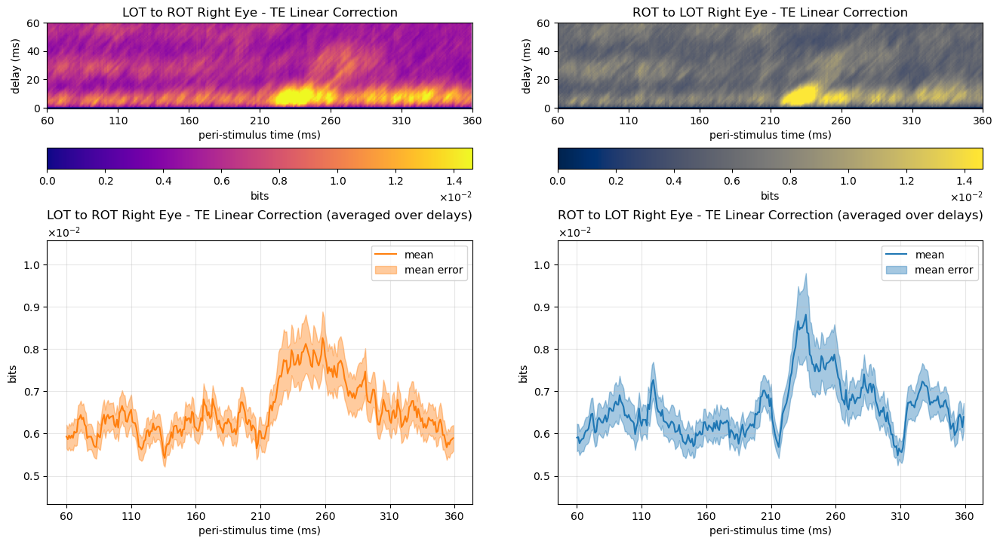

In [330]:
plot_map4(right_LR[4, :, :], right_RL[4, :, :], 'Right Eye - TE Linear Correction',0.8,1.2,'Paper',290)

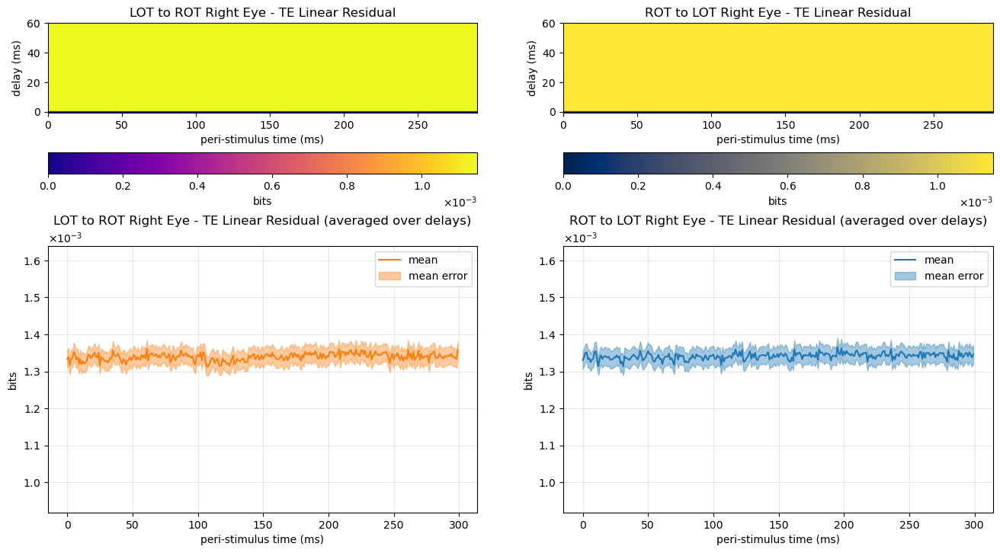

In [351]:
plot_map4(abs(right_LR[4, :, :, :]-right_LR[0, :, :, : ]), abs(right_RL[4, :, :, :]-right_RL[0, :, :, :]), 'Right Eye - TE Linear Residual',0.7,1.2,'Paper',290)

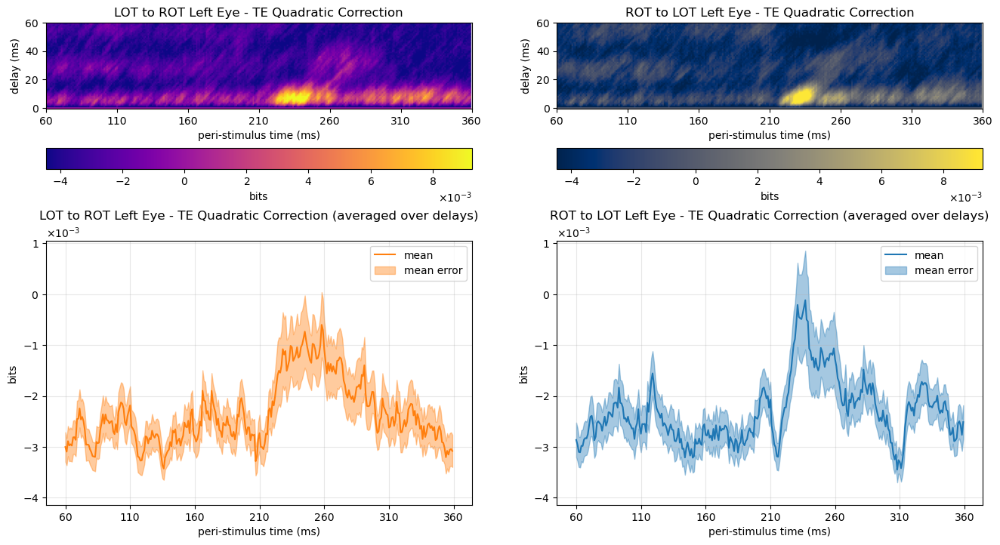

In [332]:
plot_map4(left_LR[3, :, :], left_RL[3, :, :], 'Left Eye - TE Quadratic Correction',1.2,-9,'Paper',290)

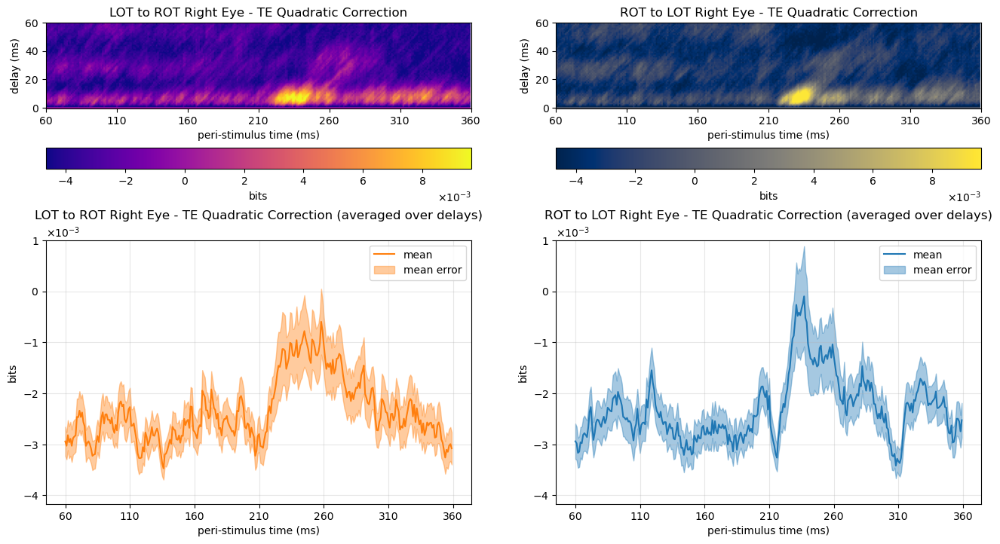

In [334]:
plot_map4(right_LR[3, :, :], right_RL[3, :, :], 'Right Eye - TE Quadratic Correction',1.2,-10,'Paper',290)

For the FIT measure the assumptions made are the same, a linear correction is correct but the original size is close to the asymptotic. A quadratic correction gives negative values, discarding it as the correct approximation of our dataset underlying bias.

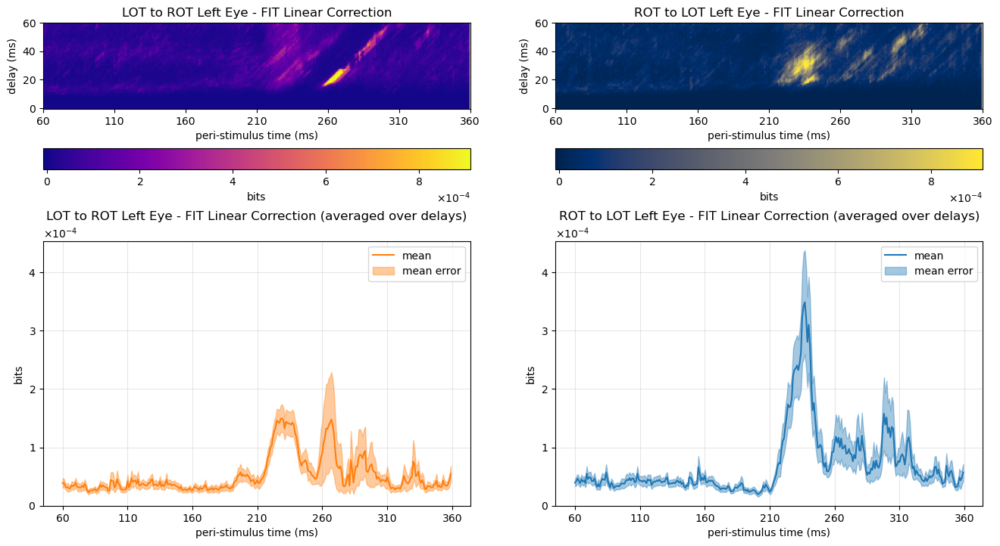

In [335]:
plot_map4(left_LR[6, :, :], left_RL[6, :, :], 'Left Eye - FIT Linear Correction',0.0,1.3,'Paper',290)

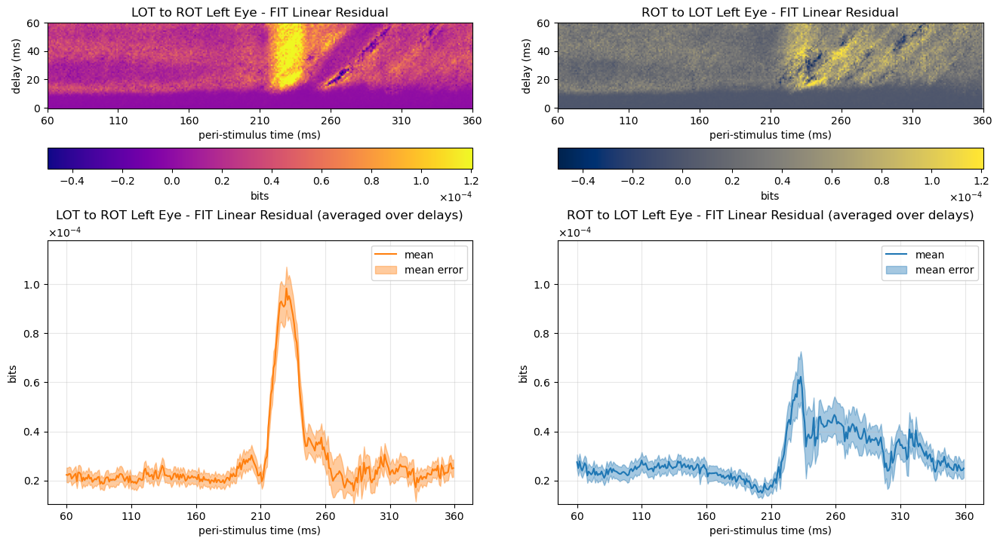

In [336]:
plot_map4(left_LR[6, :, :, :]-left_LR[1, :, :, : ], left_RL[6, :, :, :]-left_RL[1, :, :, :], 'Left Eye - FIT Linear Residual',0.7,1.2,'Paper',290)

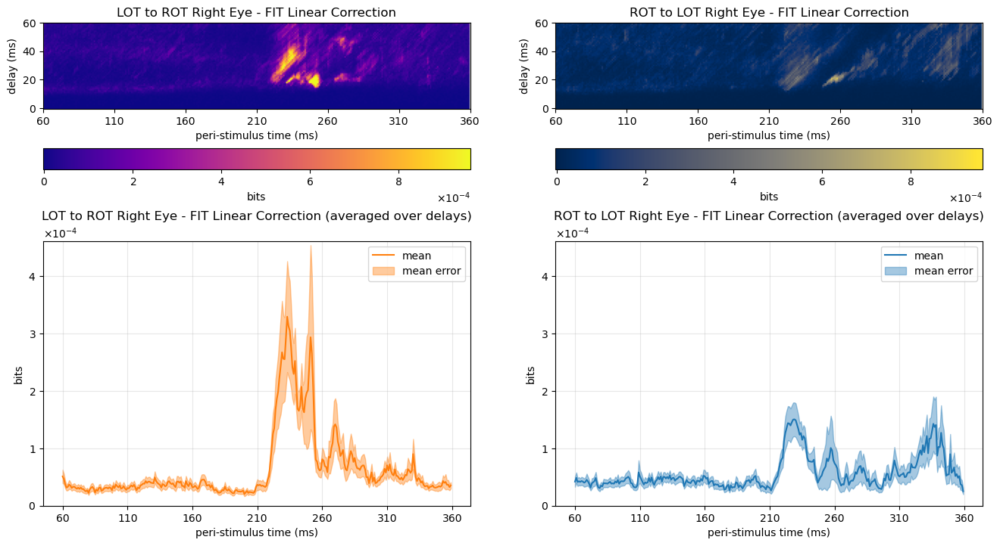

In [337]:
plot_map4(right_LR[6, :, :], right_RL[6, :, :], 'Right Eye - FIT Linear Correction',0,1.4,'Paper',290)

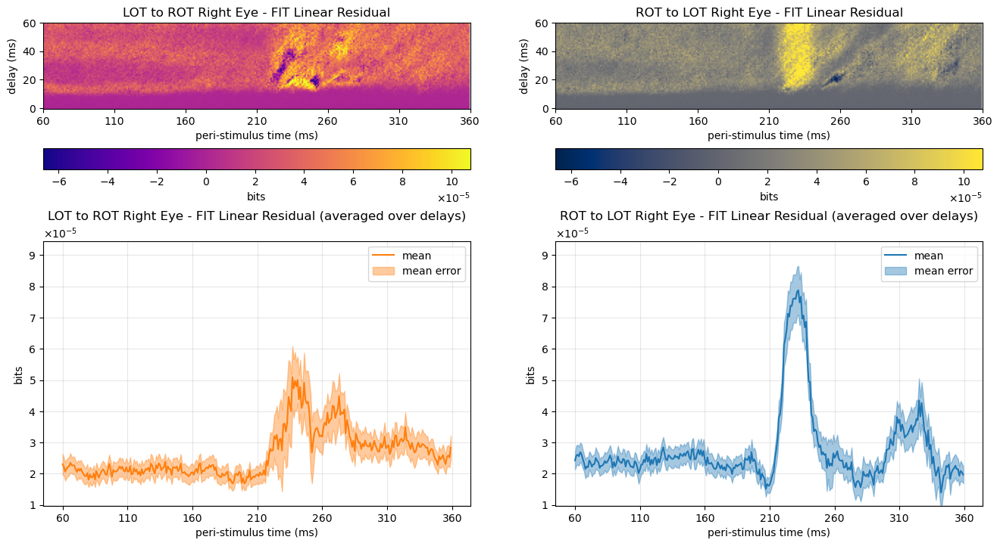

In [338]:
plot_map4(right_LR[6, :, :, :]-right_LR[1, :, :, : ], right_RL[6, :, :, :]-right_RL[1, :, :, :], 'Right Eye - FIT Linear Residual',0.7,1.2,'Paper',290)

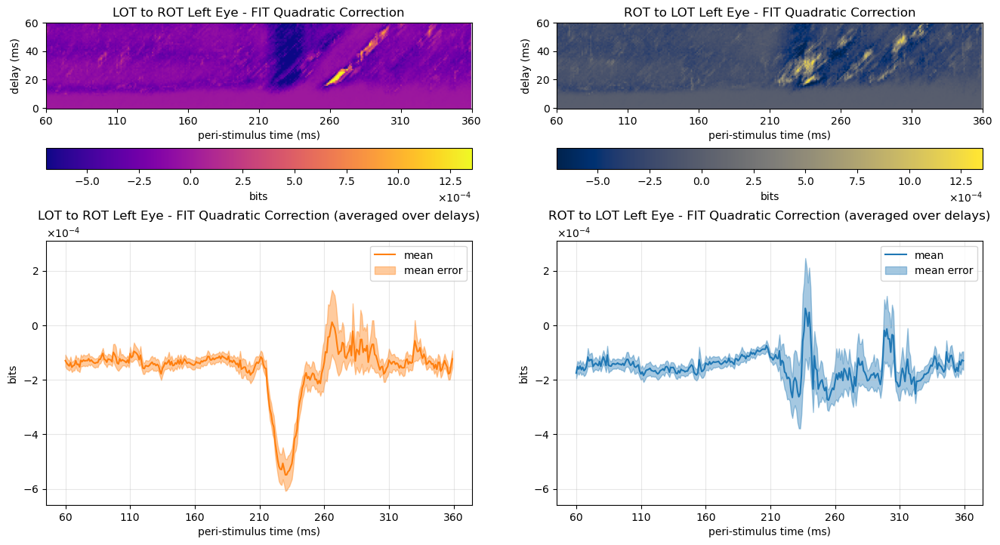

In [339]:
plot_map4(left_LR[5, :, :], left_RL[5, :, :], 'Left Eye - FIT Quadratic Correction',1.2,5,'Paper',290)

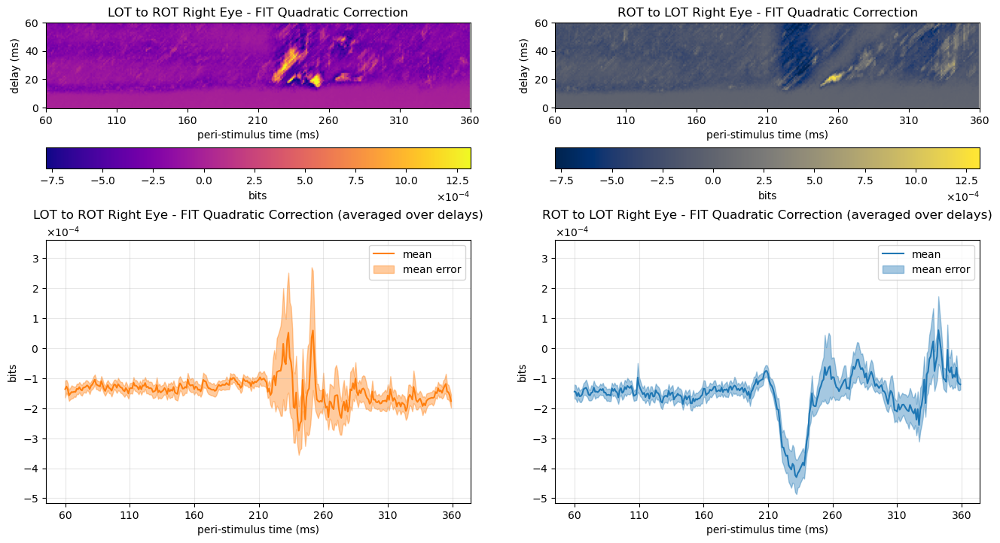

In [340]:
plot_map4(right_LR[5, :, :,:], right_RL[5, :, :,:], 'Right Eye - FIT Quadratic Correction',1.2,6,'Paper',290)

# New Data

The new data consisted again in EEG data measured on a participant of a lab experiment. Images from 5 different categories ('faces', 'scenes', 'bodies', 'tools', 'scrambled') were shown and the participant was asked to classify them.<br>
We chose to analyze the OT brain regions from both sides in order to see the information flow from ROT to LOT and vice versa seen in the paper data. <br>
We also chose to see if there is eye-specific information flow from Visual OT to Motor areas in the brain in both directions.

In [158]:
# files
correct_binning = 'results_correct_800_all.pkl'
wrong_binning = 'results_wrong_800_all.pkl'

# load correct values
with open(correct_binning, 'rb') as f:
    data_raw = pkl.load(f) # deserialize using load()
    lr_di_vis = data_raw[0]
    lr_fit_vis = data_raw[1]
    lrq_di_vis = data_raw[2]
    lrl_di_vis = data_raw[3]
    lrq_fit_vis = data_raw[4]
    lrl_fit_vis = data_raw[5]
    rl_di_vis = data_raw[6] 
    rl_fit_vis = data_raw[7] 
    rlq_di_vis = data_raw[8] 
    rll_di_vis = data_raw[9] 
    rlq_fit_vis = data_raw[10] 
    rll_fit_vis = data_raw[11] 
    lr_di_mot = data_raw[12] 
    lr_fit_mot = data_raw[13] 
    lrq_di_mot = data_raw[14] 
    lrl_di_mot = data_raw[15] 
    lrq_fit_mot = data_raw[16] 
    lrl_fit_mot = data_raw[17] 
    rl_di_mot = data_raw[18] 
    rl_fit_mot = data_raw[19]
    rlq_di_mot = data_raw[20] 
    rll_di_mot = data_raw[21] 
    rlq_fit_mot = data_raw[22] 
    rll_fit_mot = data_raw[23] 

### Visual

We can see how FIT can better understand that there is no signal being transmitted from LOT to ROT while it enhances the signal being transmitted from ROT to LOT.


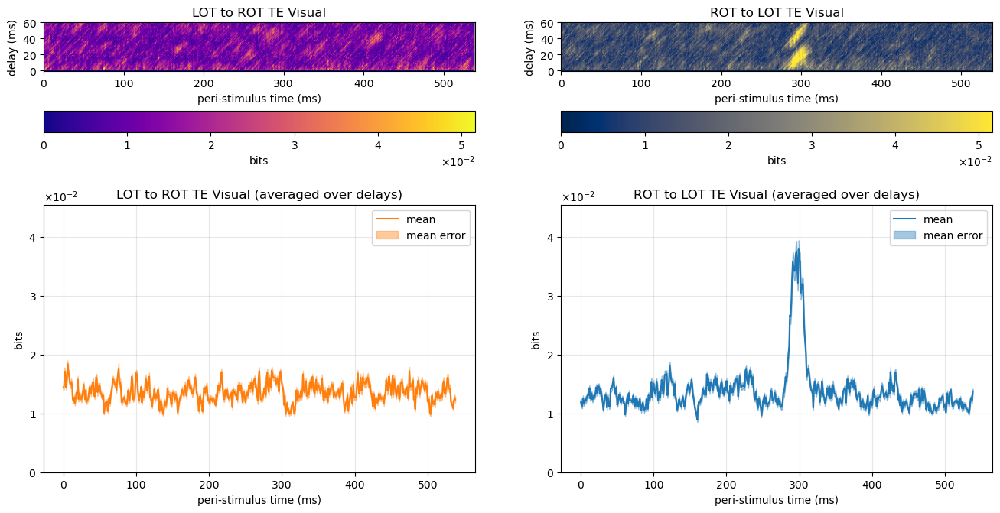

In [354]:
plot_map4(lr_di_vis.T, rl_di_vis.T, 'TE Visual',0,1.2,'New',539)

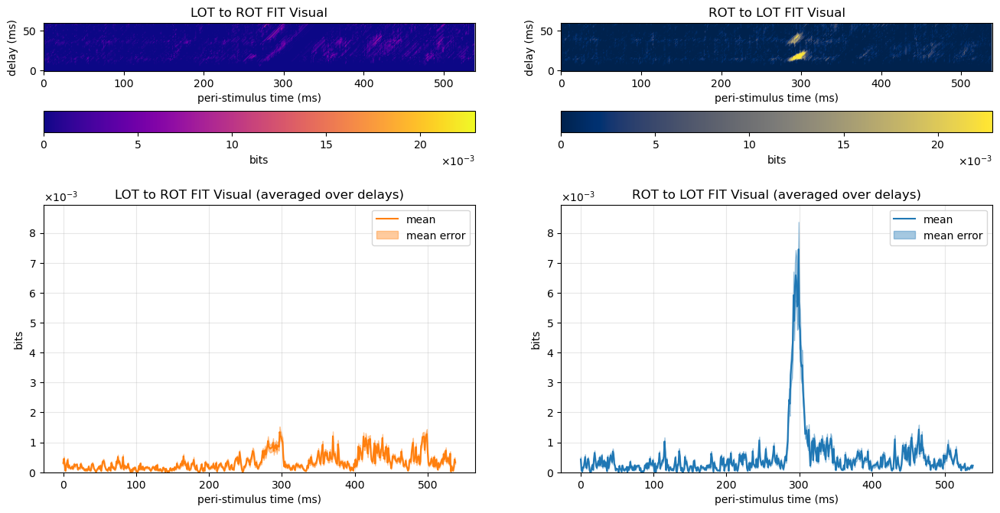

In [227]:
plot_map4(lr_fit_vis.T, rl_fit_vis.T, 'FIT Visual',0,1.2,'New',539)

Here we show the linear and quadratic corrections for TE and FIT, the same considerations as before apply.

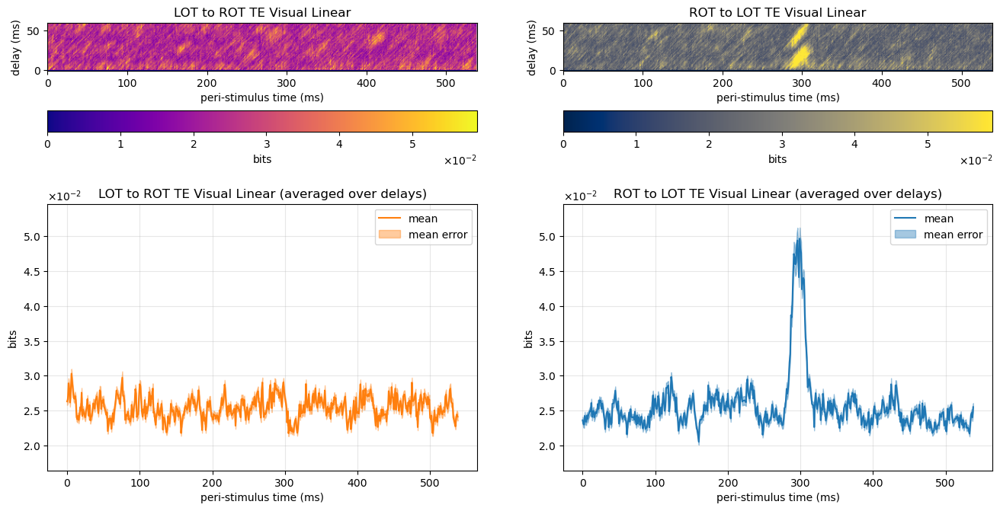

In [226]:
plot_map4(lrl_di_vis.T, rll_di_vis.T, 'TE Visual Linear',0.8,1.1,'New',539)

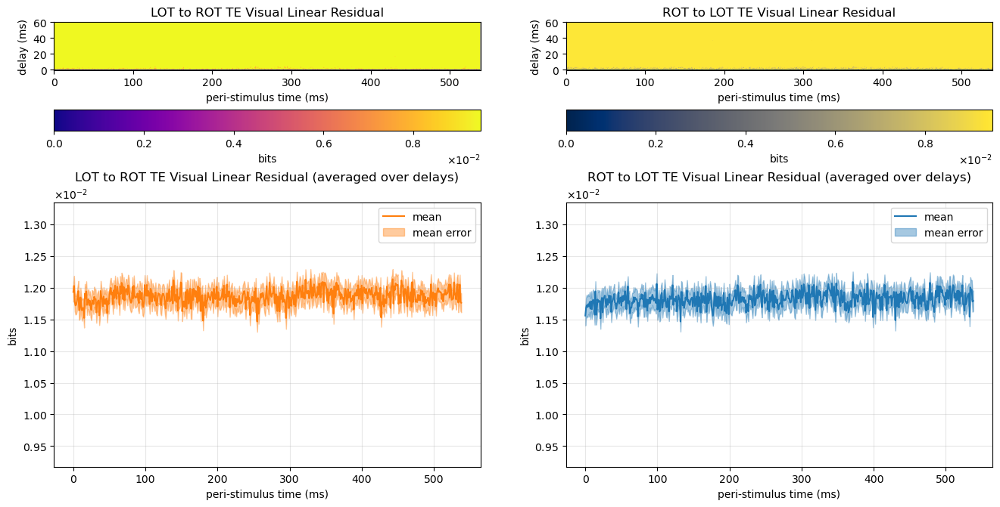

In [360]:
plot_map4(lrl_di_vis.T-lr_di_vis.T, rll_di_vis.T-rl_di_vis.T, 'TE Visual Linear Residual',0.8,1.1,'New',539)

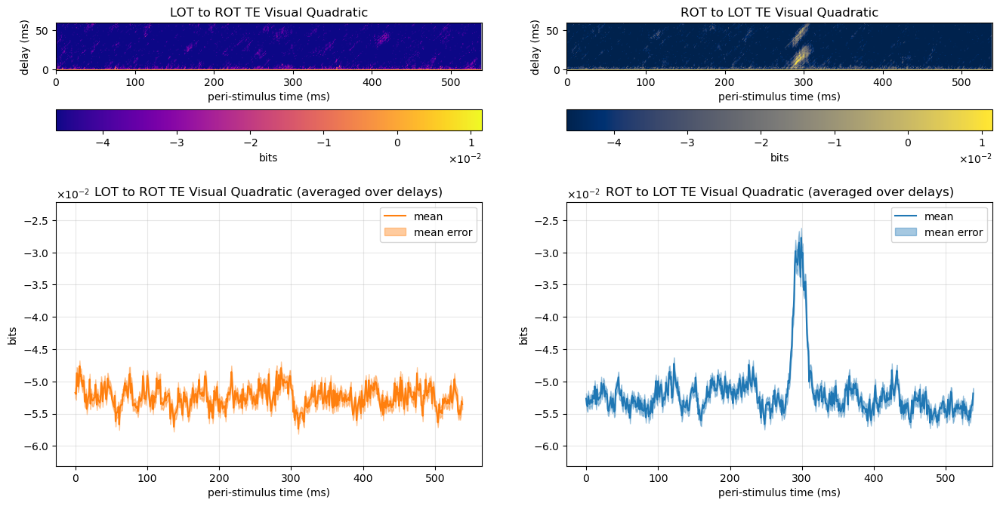

In [224]:
plot_map4(lrq_di_vis.T, rlq_di_vis.T, 'TE Visual Quadratic',1.1,0.8,'New',539)

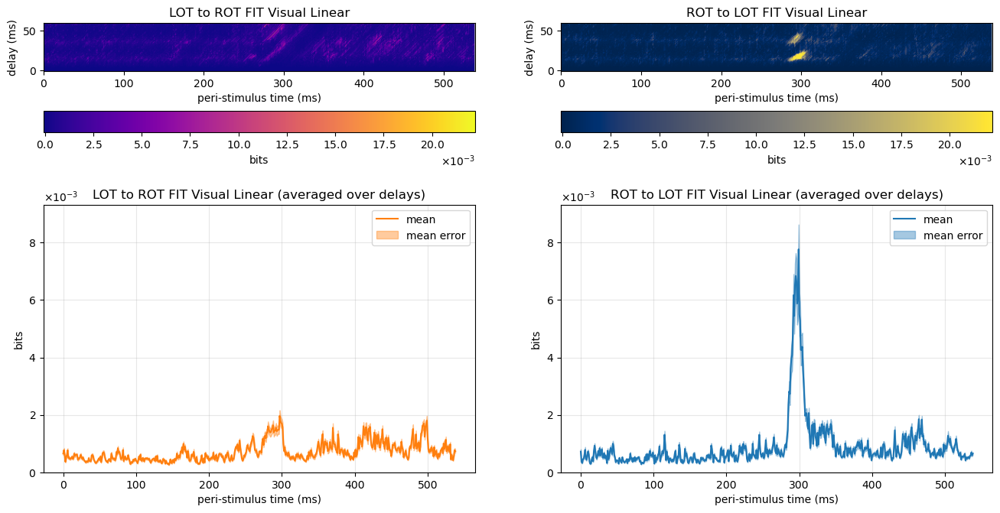

In [223]:
plot_map4(lrl_fit_vis.T, rll_fit_vis.T, 'FIT Visual Linear',0,1.2,'New',539)

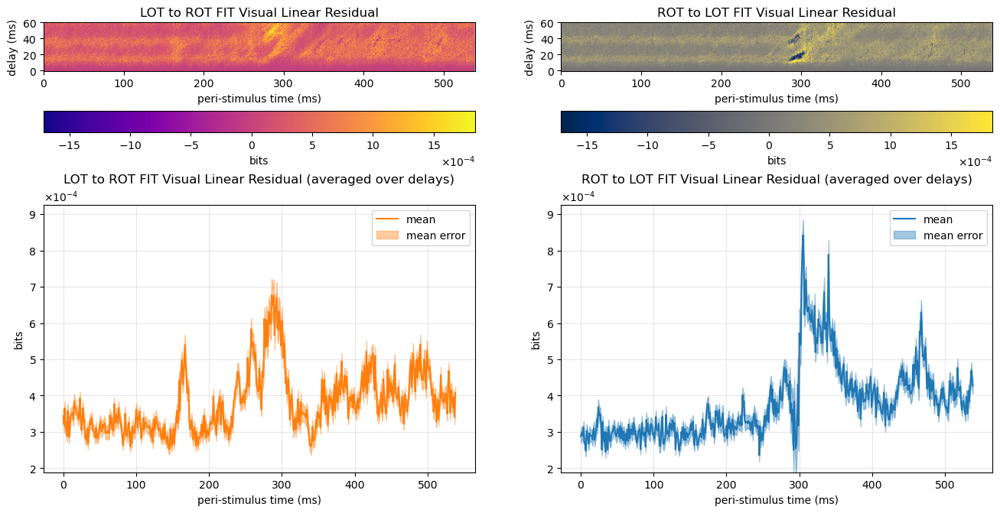

In [359]:
plot_map4(lrl_fit_vis.T-lr_fit_vis.T, rll_fit_vis.T-rl_fit_vis.T, 'FIT Visual Linear Residual',0.8,1.1,'New',539)

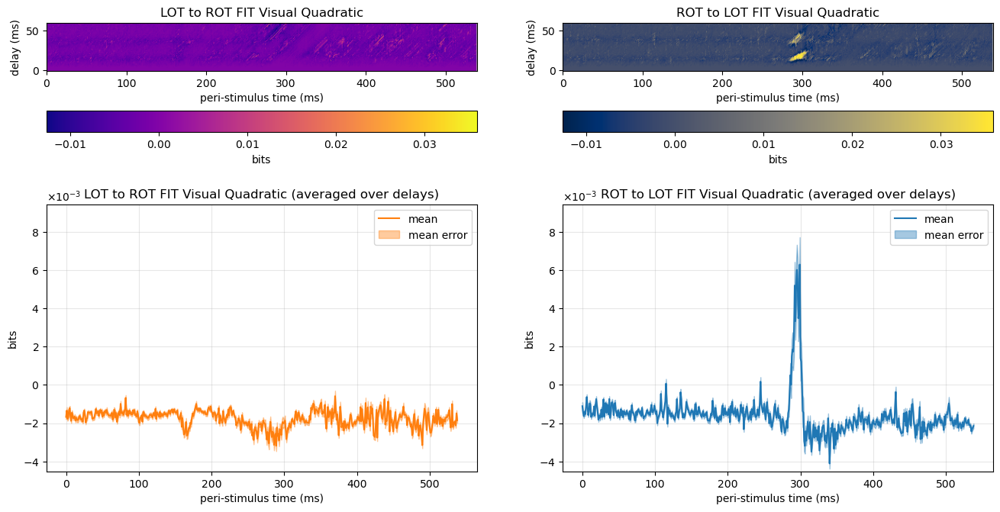

In [238]:
plot_map4(lrq_fit_vis.T, rlq_fit_vis.T, 'FIT Visual Quadratic',1.1,1.5,'New',539)

### Visual to Motor

As far as visual to motor goes we can see that TE struggles to find any clear signal being sent in any direction while FIT measures a signal in both directions with the strongest from ROT to LOT (maybe an indicator the participant was right handed ?). <br>
Furthermore both signals were measured about 40 ms later than the visual to visual transmission, an indication of the correlation between sequentiality of the actions performed and the information flow inside the brain regions.

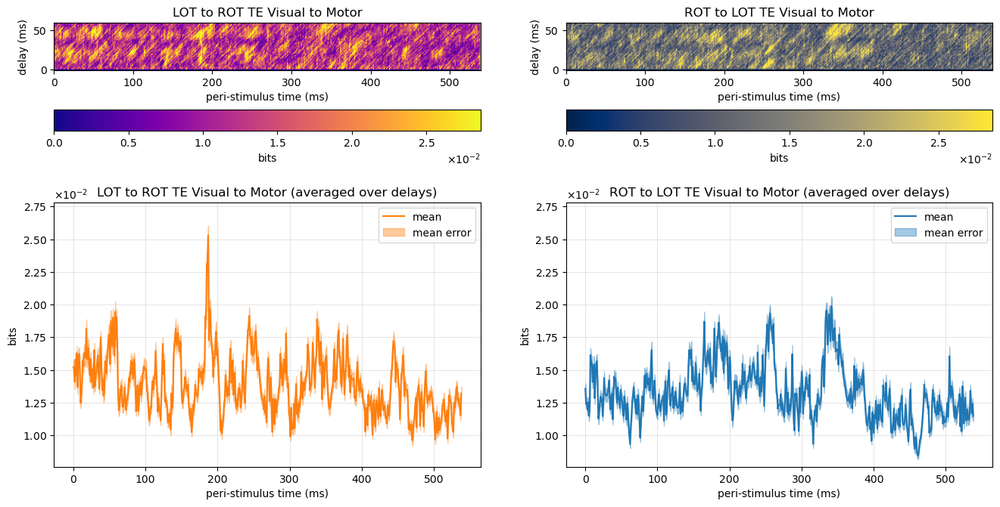

In [241]:
plot_map4(lr_di_mot.T, rl_di_mot.T, 'TE Visual to Motor',0.9,1.1,'New',539)

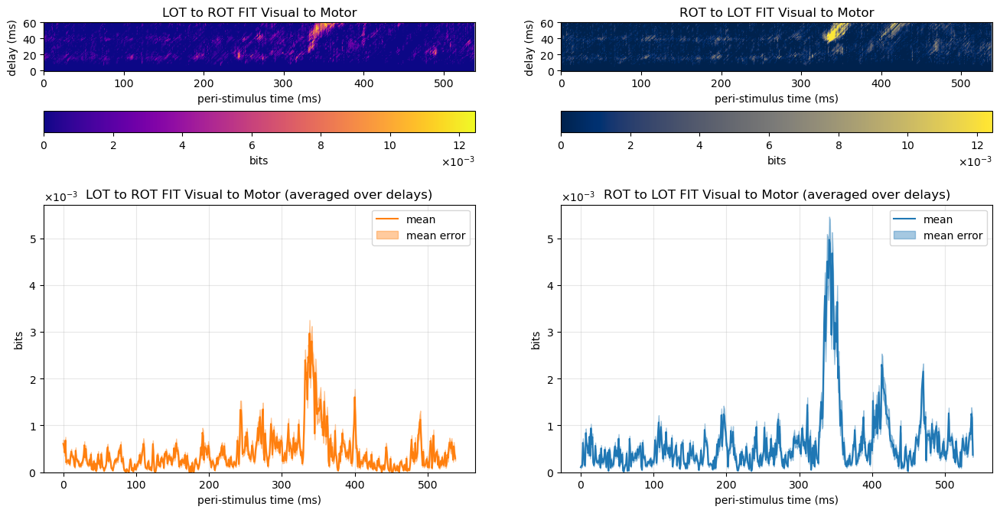

In [361]:
plot_map4(lr_fit_mot.T, rl_fit_mot.T, 'FIT Visual to Motor',0,1.15,'New',539)

Again we show linear and quadratic corrections for TE and FIT

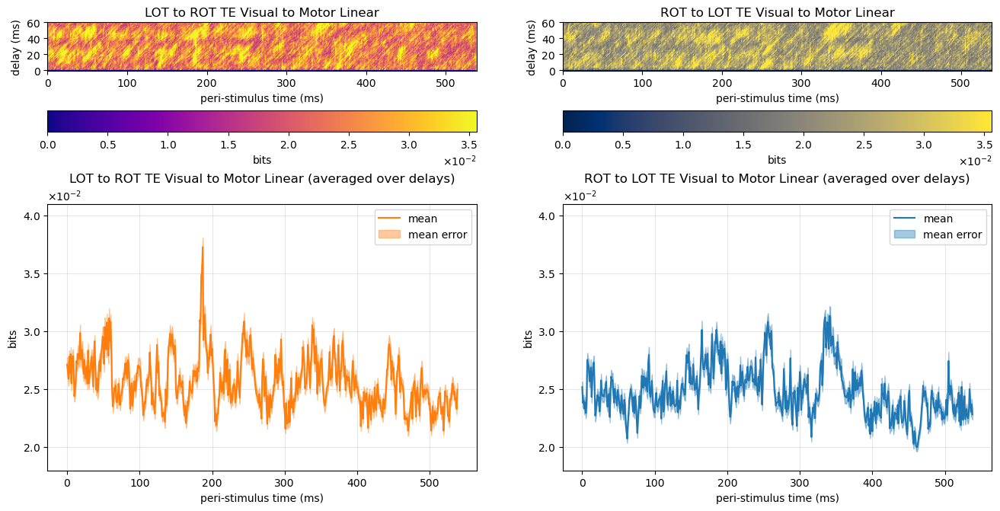

In [362]:
plot_map4(lrl_di_mot.T, rll_di_mot.T, 'TE Visual to Motor Linear',0.9,1.1,'New',539)

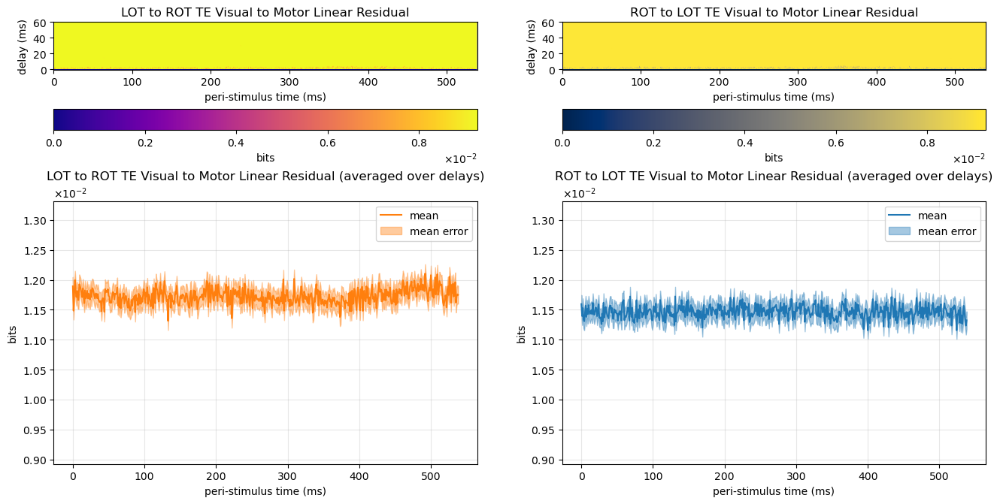

In [363]:
plot_map4(lrl_di_mot.T-lr_di_mot.T, rll_di_mot.T-rl_di_mot.T, 'TE Visual to Motor Linear Residual',0.8,1.1,'New',539)

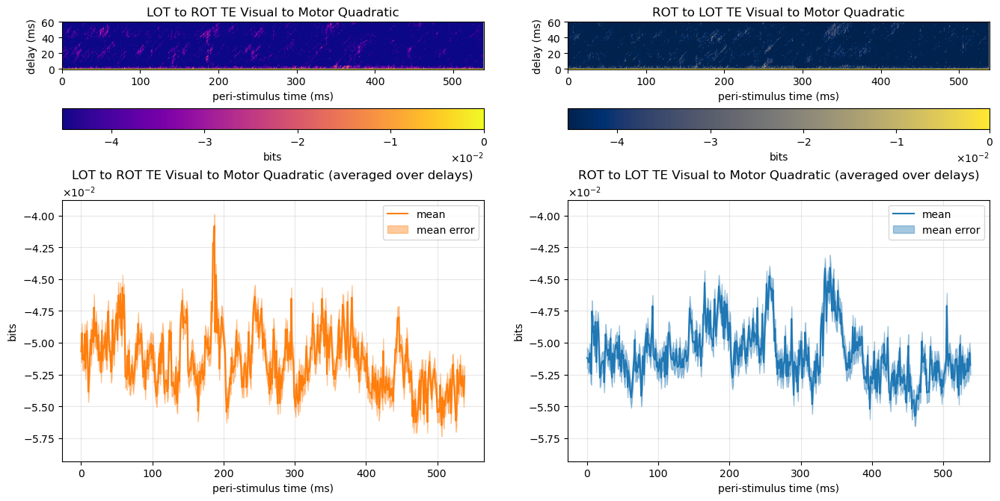

In [364]:
plot_map4(lrq_di_mot.T, rlq_di_mot.T, 'TE Visual to Motor Quadratic',1.05,0.95,'New',539)

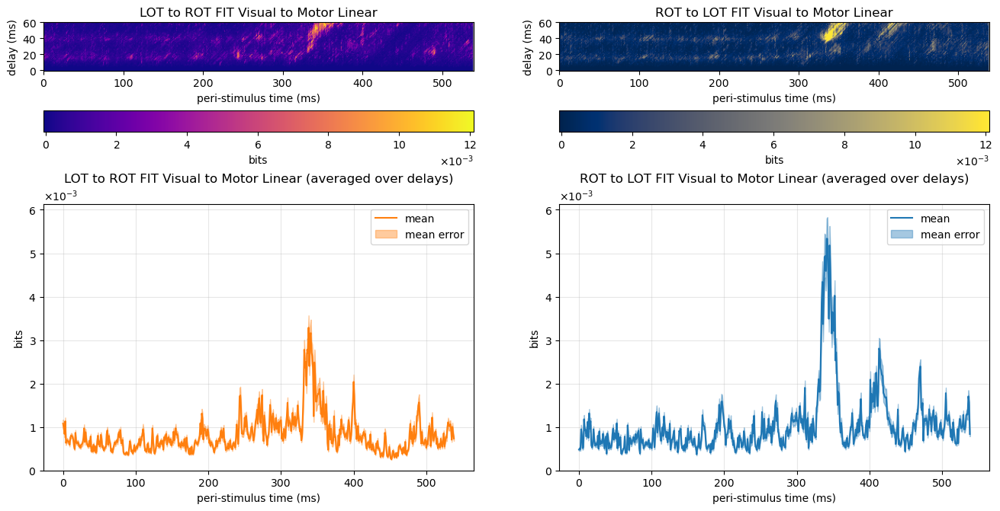

In [365]:
plot_map4(lrl_fit_mot.T, rll_fit_mot.T, 'FIT Visual to Motor Linear',0,1.15,'New',539)

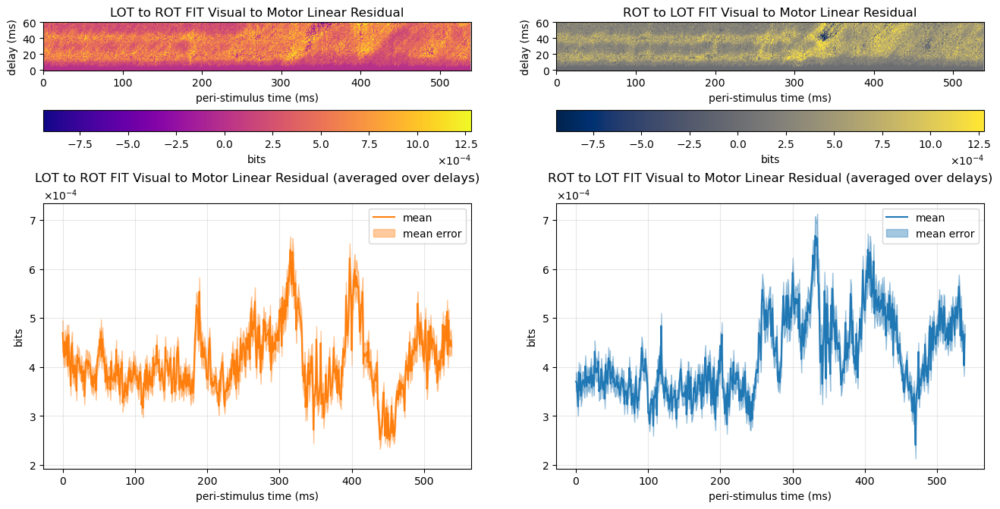

In [366]:
plot_map4(lrl_fit_mot.T-lr_fit_mot.T, rll_fit_mot.T-rl_fit_mot.T, 'FIT Visual to Motor Linear Residual',0.8,1.1,'New',539)

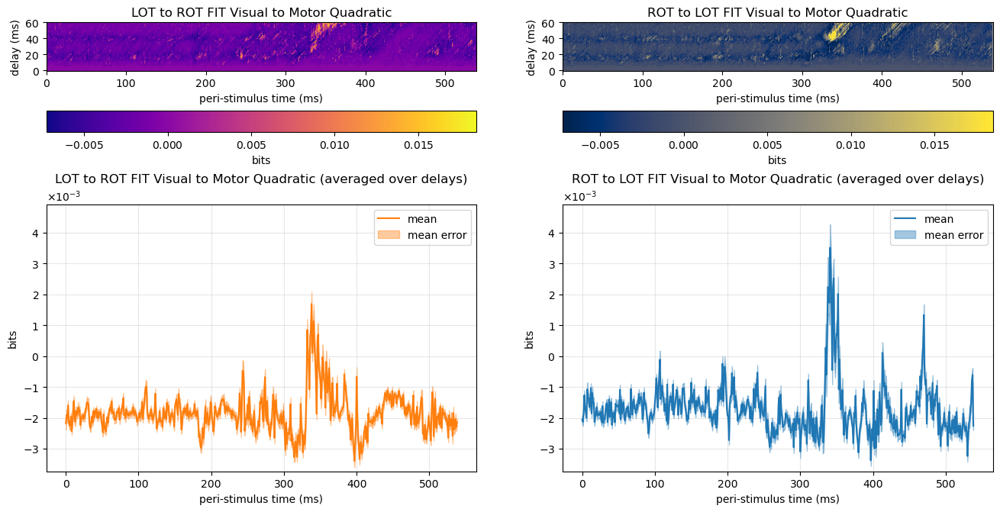

In [367]:
plot_map4(lrq_fit_mot.T, rlq_fit_mot.T, 'FIT Visual to Motor Quadratic',1.1,1.4,'New',539)